In [228]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [229]:
#Read CSV
census_output = "census_output.csv"
census_output = pd.read_csv(census_output)


In [230]:
#Fill NaN with 0 (NaN values are for international migration. We are only interested in domestic migration)
census_output = census_output.fillna(0)

In [231]:
#Split County into two County and State columns
county_split = census_output["County"].str.split(pat=', ', expand=True)
census_output["State"] = county_split[1]
census_output['State'].nunique()

44

In [232]:
#Get total NetValues
census_output_net = census_output.loc[:, ["State", "County", "2009NET", "2010NET", "2011NET", "2012NET", "2013NET", "2014NET", "2015NET"]]
census_output_net.head()

,State,County,2009NET,2010NET,2011NET,2012NET,2013NET,2014NET,2015NET
0,Alabama,"Autauga County, Alabama",0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Alabama,"Autauga County, Alabama",0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Alabama,"Autauga County, Alabama",28.0,27.0,71.0,92.0,54.0,-11.0,-76.0
3,Alabama,"Autauga County, Alabama",-18.0,-15.0,3.0,0.0,-6.0,4.0,6.0
4,Alabama,"Autauga County, Alabama",38.0,44.0,16.0,-132.0,-118.0,-141.0,-149.0


In [233]:
#Groupby State
state_migration = census_output_net.groupby(["State"], as_index=False).sum()
state_migration

,State,2009NET,2010NET,2011NET,2012NET,2013NET,2014NET,2015NET
0,Alabama,11940.0,12308.0,7695.0,2891.0,3354.0,1143.0,1862.0
1,Alaska,-16935.0,-22202.0,-26858.0,-29994.0,-30407.0,-31251.0,-25440.0
2,Arizona,74082.0,57802.0,41389.0,30857.0,28237.0,32020.0,31151.0
3,Arkansas,8289.0,7155.0,6248.0,5912.0,4982.0,3678.0,2781.0
4,California,-132631.0,-110279.0,-93684.0,-76620.0,-71269.0,-64494.0,-63359.0
5,Colorado,21349.0,24921.0,25325.0,30632.0,32351.0,35018.0,33974.0
6,Connecticut,-10208.0,-11555.0,-9550.0,-6618.0,-6255.0,-6828.0,-6881.0
7,District of Columbia,-13606.0,-8836.0,-7239.0,-4945.0,-3818.0,-3413.0,-3886.0
8,Florida,84627.0,60072.0,40209.0,56914.0,70323.0,83527.0,98963.0
9,Georgia,51566.0,38728.0,21619.0,17098.0,14793.0,11928.0,12634.0


In [234]:
#Create column that has net total migration
state_migration["Total"] = state_migration.sum(axis=1)

#Reassign columns
state_migration.columns = ['State', '2009', '2010', '2011', '2012', '2013', '2014', '2015', 'Total']
state_migration.head()


,State,2009,2010,2011,2012,2013,2014,2015,Total
0,Alabama,11940.0,12308.0,7695.0,2891.0,3354.0,1143.0,1862.0,41193.0
1,Alaska,-16935.0,-22202.0,-26858.0,-29994.0,-30407.0,-31251.0,-25440.0,-183087.0
2,Arizona,74082.0,57802.0,41389.0,30857.0,28237.0,32020.0,31151.0,295538.0
3,Arkansas,8289.0,7155.0,6248.0,5912.0,4982.0,3678.0,2781.0,39045.0
4,California,-132631.0,-110279.0,-93684.0,-76620.0,-71269.0,-64494.0,-63359.0,-612336.0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


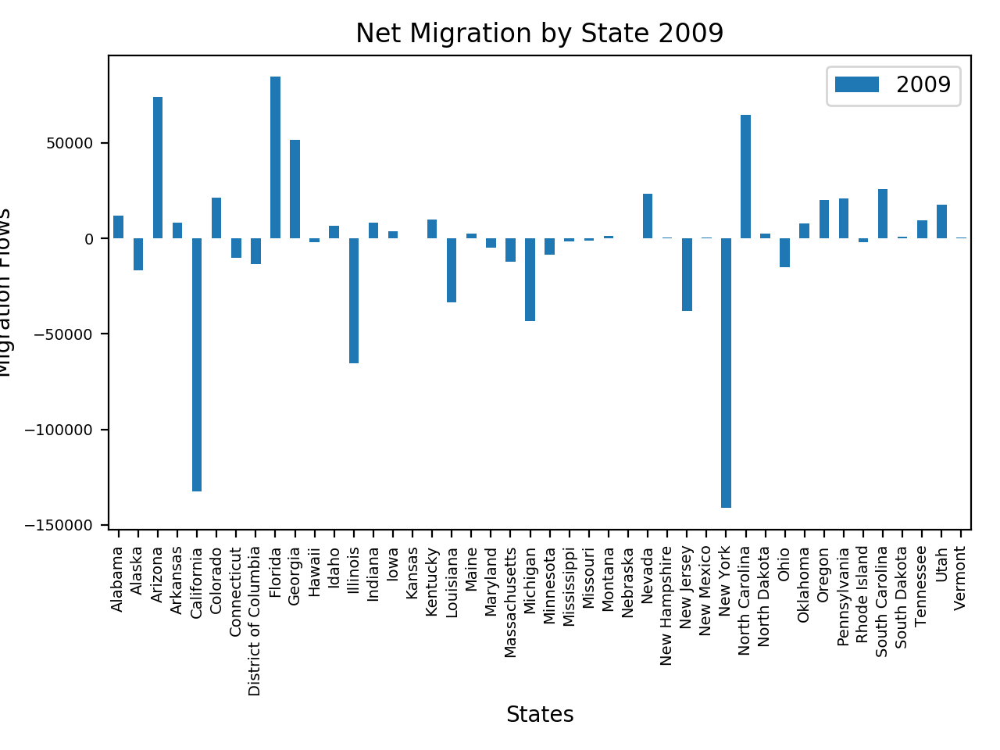

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


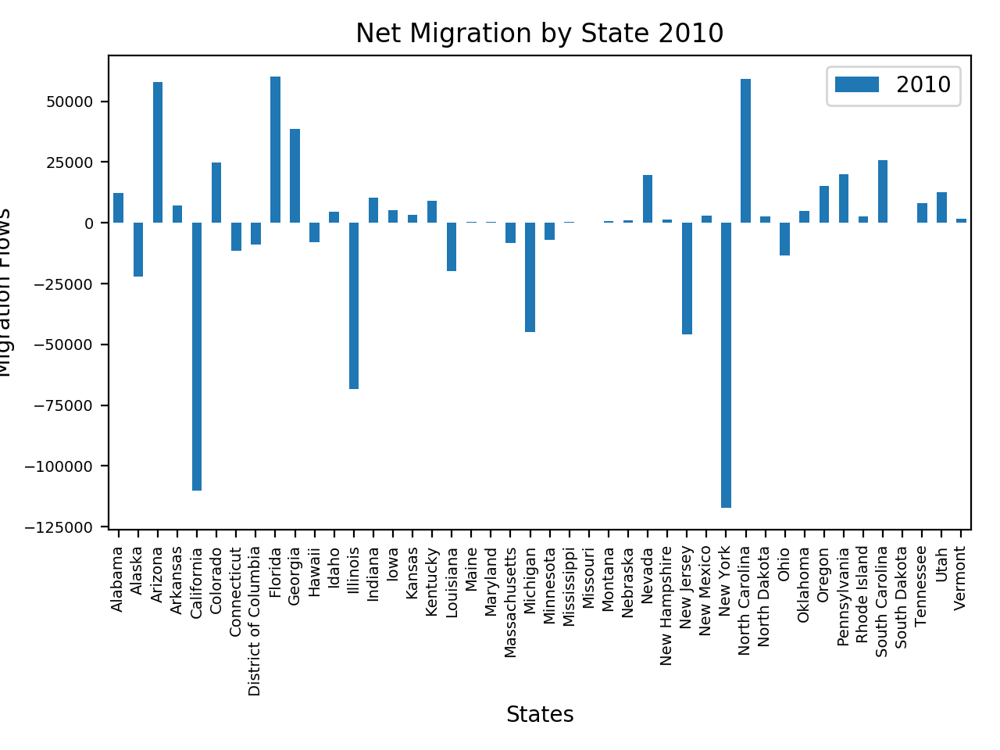

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


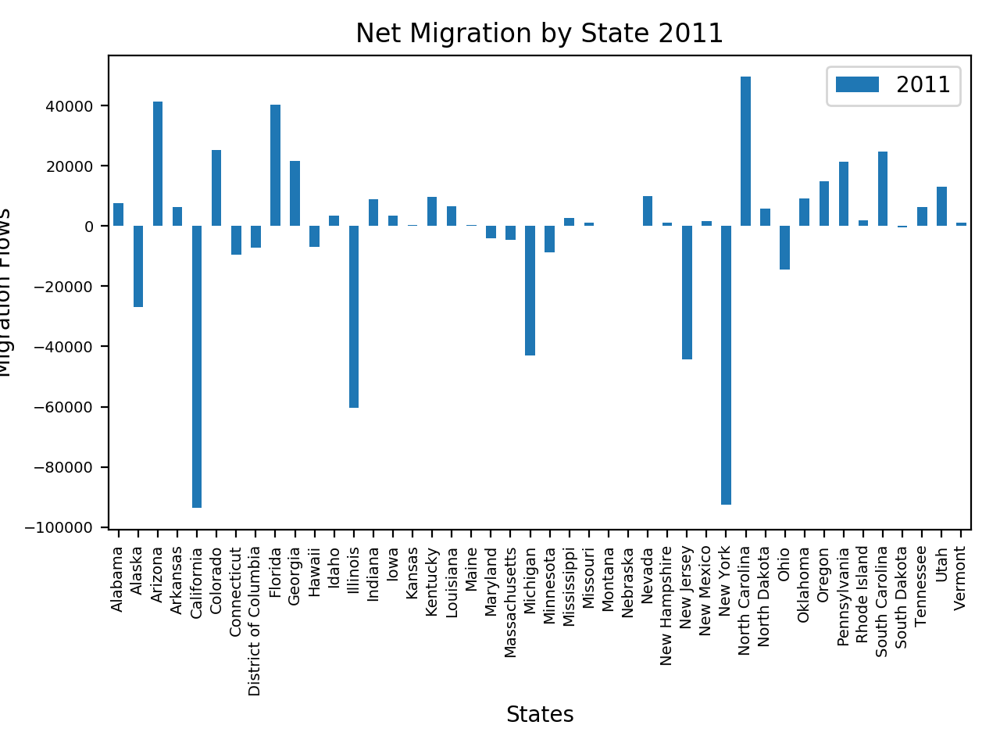

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [236]:
years = ['2009', '2010', '2011', '2012', '2013', '2014', '2015', 'Total']
for year in years:
    plt.figure(dpi=1200)
    state_migration[['State', f'{year}']].set_index(['State']).plot(kind="bar", title=f"Net Migration by State {year}", fontsize=7)
    plt.tight_layout()
    plt.ylabel("Migration Flows")
    plt.xlabel("States")
    plt.savefig(f"netMigration{year}.png")